# Lights Detection (320x320)


## Installation

In [1]:
import os
import pathlib

In [2]:

# Clone the tensorflow models repository if it doesn't already exist
if "models" in pathlib.Path.cwd().parts:
    while "models" in pathlib.Path.cwd().parts:
        os.chdir('..')
elif not pathlib.Path('models').exists():
    !git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 2861, done.
remote: Counting objects: 100% (2861/2861), done.
remote: Compressing objects: 100% (2395/2395), done.
remote: Total 2861 (delta 735), reused 1335 (delta 430), pack-reused 0
Receiving objects: 100% (2861/2861), 32.88 MiB | 6.44 MiB/s, done.
Resolving deltas: 100% (735/735), done.
Updating files: 100% (2622/2622), done.


In [3]:
# install the Object Detection API
# !cd models/research/ && protoc object_detection/protos/*.proto --python_out=. && cp object_detection/packages/tf2/setup.py . && python -m pip install .
# !cd models/research/ && protoc object_detection/protos/*.proto --python_out=. && python -m pip install .


# Label data

In [121]:
!python3 ../labelImg-master/labelImg.py

# Generate Training Data

In [11]:
# convert xml to csv
!python3 xml_to_csv.py

Successfully converted xml to csv.


### Create TFRecord


In [10]:
!python3 generate_tfrecord_new.py \
    --csv_input='./images/train_labels.csv' \
    --image_dir='./images/train/' \
    --output_path='./tfrecords/train.record' \

Successfully created the TFRecords: /Users/sylviasun/projects/datacentric/object_detection/tl_detect/./tfrecords/train.record


In [11]:
!python3 generate_tfrecord_new.py \
    --csv_input='./images/test_labels.csv' \
    --image_dir='./images/test/' \
    --output_path='./tfrecords/test.record' \

Successfully created the TFRecords: /Users/sylviasun/projects/datacentric/object_detection/tl_detect/./tfrecords/test.record


# Train the model

In [3]:
!python3 models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path='./configs/ssd_resnet50_v1_fpn_320x320_coco17_tpu-8.config' \
    --num_train_steps=500 \
    --model_dir='./output_multi_class/' \
    --alsologtostderr \
    --use_tpu=False \

2021-08-27 13:43:44.520440: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
W0827 13:43:44.525547 4661239296 cross_device_ops.py:1387] There are non-GPU devices in `tf.distribute.Strategy`, not using nccl allreduce.
INFO:tensorflow:Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)
I0827 13:43:44.550070 4661239296 mirrored_strategy.py:369] Using MirroredStrategy with devices ('/job:localhost/replica:0/task:0/device:CPU:0',)
INFO:tensorflow:Maybe overwriting train_steps: 500
I0827 13:43:44.597819 4661239296 config_util.py:552] Maybe overwriting train_steps: 500
INFO:tensorflow:Maybe overwriting use_bfloat16: False
I0827 13:43:44.604136 4661239296 config_util.py:552] Maybe overwriting use_bfl

# Export

In [4]:
!python3 models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir ./output_multi_class \
    --output_directory ./inference_graph \
    --pipeline_config_path ./configs/ssd_resnet50_v1_fpn_320x320_coco17_tpu-8.config

2021-08-27 14:40:26.941690: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead of:
results = tf.map_fn(fn, elems, back_prop=False)
Use:
results = tf.nest.map_structure(tf.stop_gradient, tf.map_fn(fn, elems))
W0827 14:40:27.269212 4809772544 deprecation.py:611] From /Users/sylviasun/projects/datacentric/object_detection/lib/python3.9/site-packages/tensorflow/python/autograph/impl/api.py:463: calling map_fn_v2 (from tensorflow.python.ops.map_fn) with back_prop=False is deprecated and will be removed in a future version.
Instructions for updating:
back_prop=False is deprecated. Consider using tf.stop_gradient instead.
Instead

## Load test images and run inference with new model!


In [7]:
image_path='./train/left0153.jpg'

In [9]:
!python3 detect_from_image.py -m './inference_graph/saved_model' -l './label_map.pbtxt' -i './train/left0011.jpg'

2021-08-27 14:43:57.125598: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2021-08-27 14:44:13.039486: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


## Load model and run inference

In [15]:
import os
import pathlib
import numpy as np

import tensorflow as tf 

from object_detection.utils import label_map_util
# import module for visualization. use the alias `viz_utils`
from object_detection.utils  import visualization_utils as vis_util

from PIL import Image, ImageDraw, ImageFont

model_dir = './inference_graph/saved_model'
detection_model = tf.saved_model.load(str(model_dir))

PATH_TO_LABELS = 'label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)

PATH_TO_TEST_IMAGES_DIR = pathlib.Path('./train')
TEST_IMAGE_PATHS = sorted(list(PATH_TO_TEST_IMAGES_DIR.glob("*.jpg")))

2021-08-27 16:53:16.023378: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [16]:
def run_inference_for_single_image(model, image):
    image = np.asarray(image)
    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image)
    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis,...]

    # Run inference
    model_fn = model.signatures['serving_default']
    output_dict = model_fn(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(output_dict.pop('num_detections'))
    output_dict = {key:value[0, :num_detections].numpy() 
                 for key,value in output_dict.items()}
    output_dict['num_detections'] = num_detections

    # detection_classes should be ints.
    output_dict['detection_classes'] = output_dict['detection_classes'].astype(np.int64)

    # Handle models with masks:
    if 'detection_masks' in output_dict:
        # Reframe the the bbox mask to the image size.
        detection_masks_reframed = utils_ops.reframe_box_masks_to_image_masks(
                  output_dict['detection_masks'], output_dict['detection_boxes'],
                   image.shape[0], image.shape[1])      
        detection_masks_reframed = tf.cast(detection_masks_reframed > 0.5,
                                           tf.uint8)
        output_dict['detection_masks_reframed'] = detection_masks_reframed.numpy()

    return output_dict

In [17]:
def show_inference(model, image_path):
    # the array based representation of the image will be used later in order to prepare the
    # result image with boxes and labels on it.
    image_np = np.array(Image.open(image_path))
    # Actual detection.
    output_dict = run_inference_for_single_image(model, image_np)
    # Visualization of the results of a detection.
    vis_util.visualize_boxes_and_labels_on_image_array(
      image_np,
      output_dict['detection_boxes'],
      output_dict['detection_classes'],
      output_dict['detection_scores'],
      category_index,
      instance_masks=output_dict.get('detection_masks_reframed', None),
      use_normalized_coordinates=True,
      line_thickness=8)

    display(Image.fromarray(image_np))

2021-08-27 16:53:31.896422: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


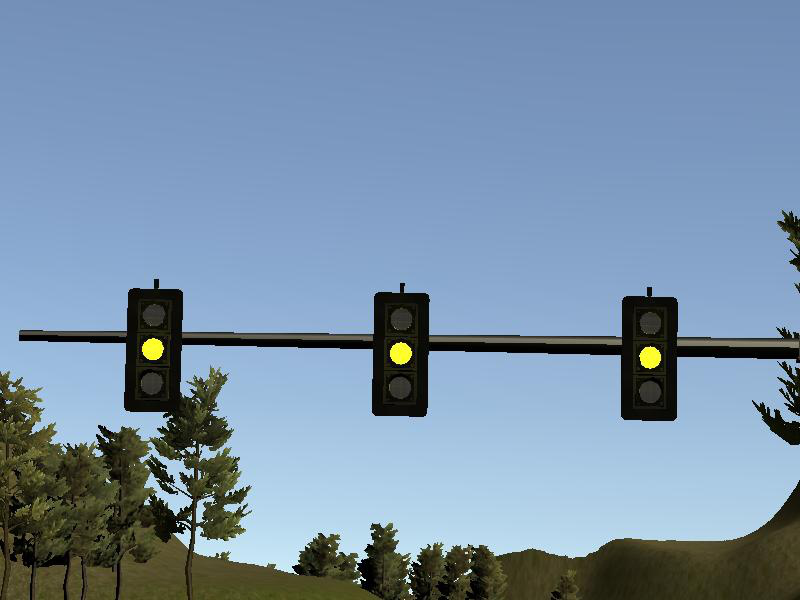

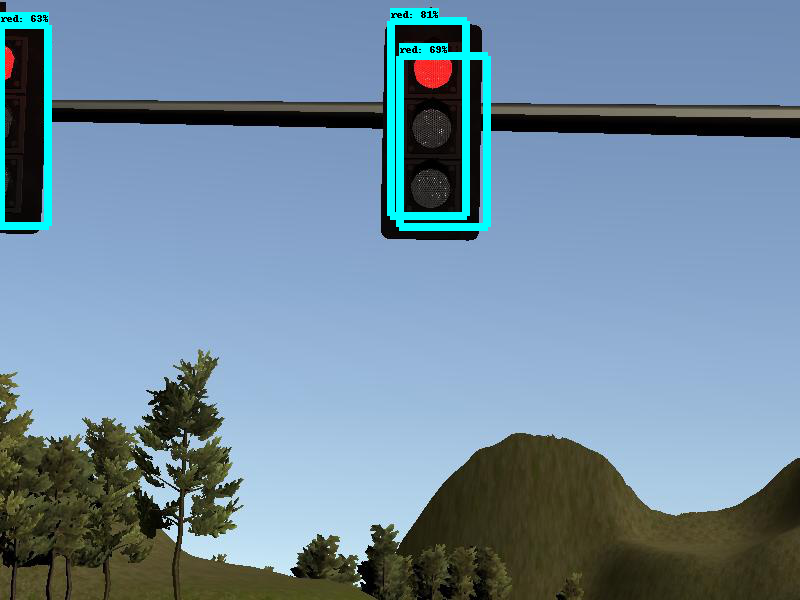

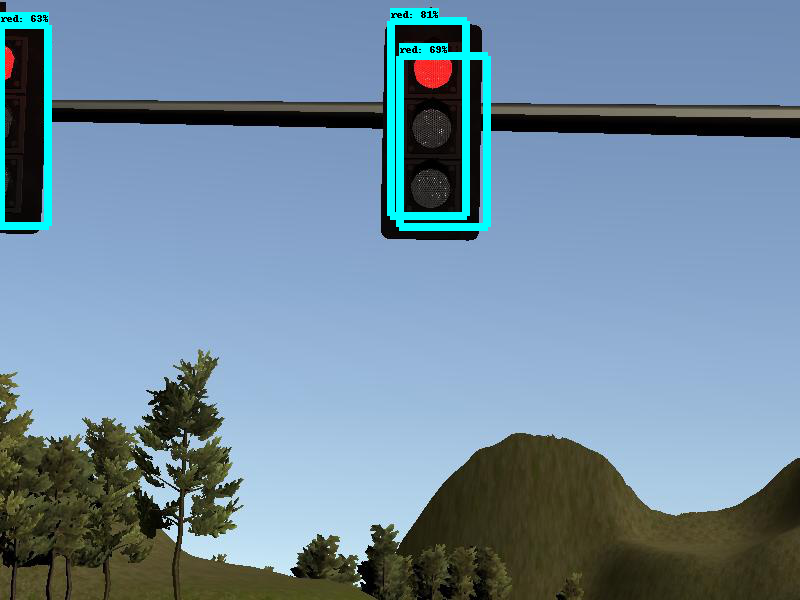

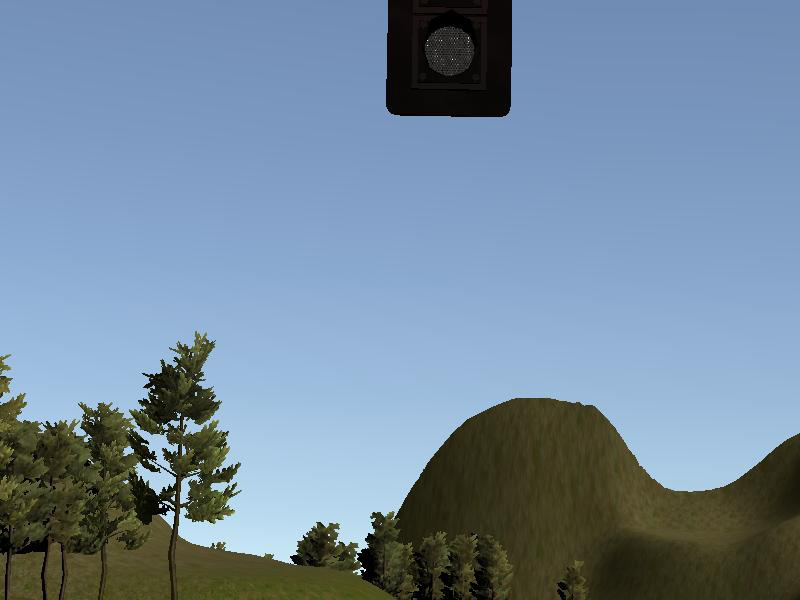

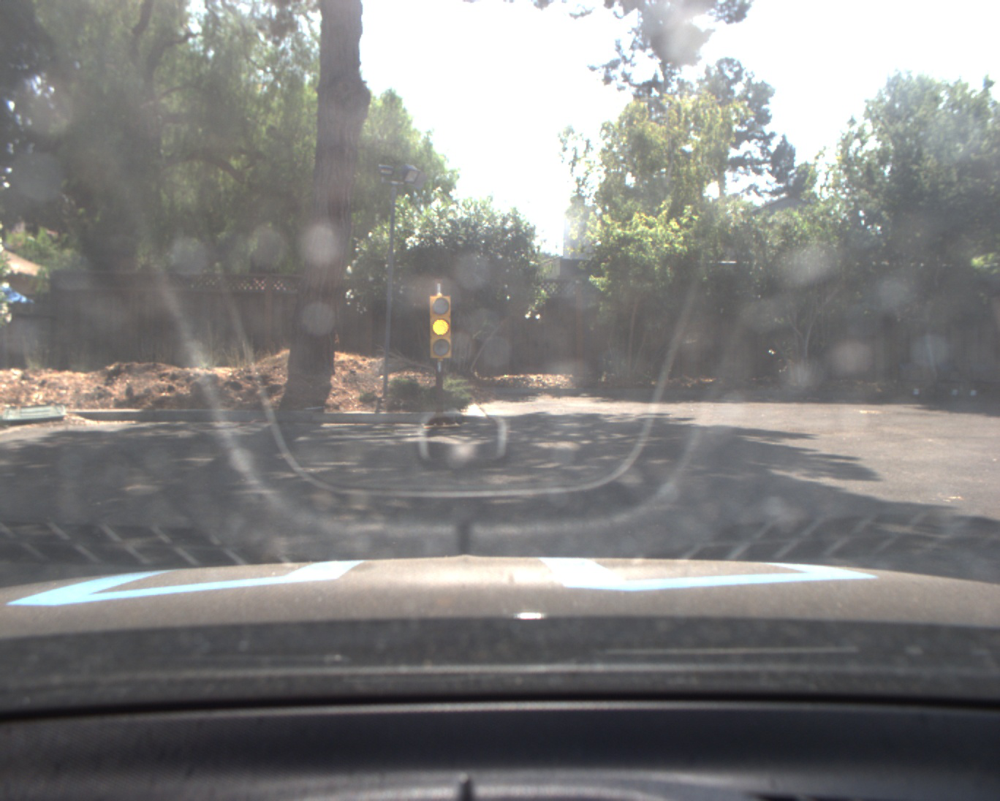

...

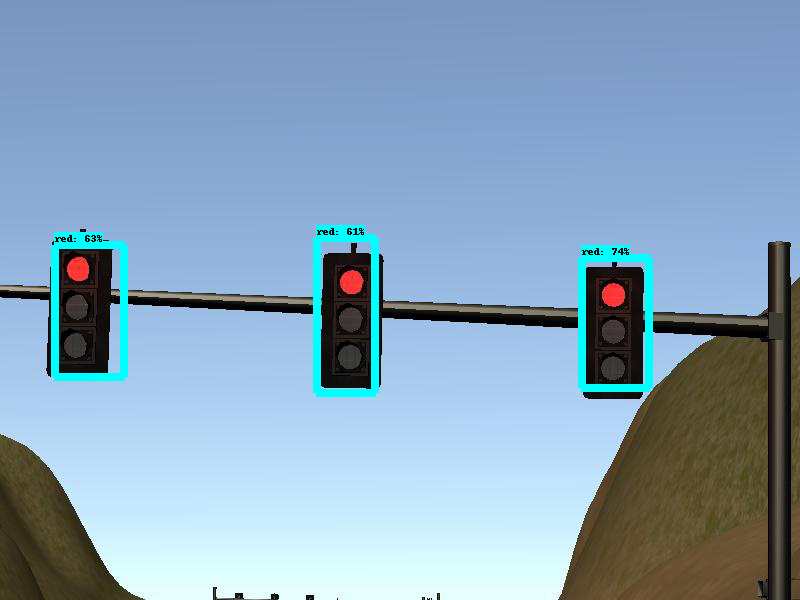

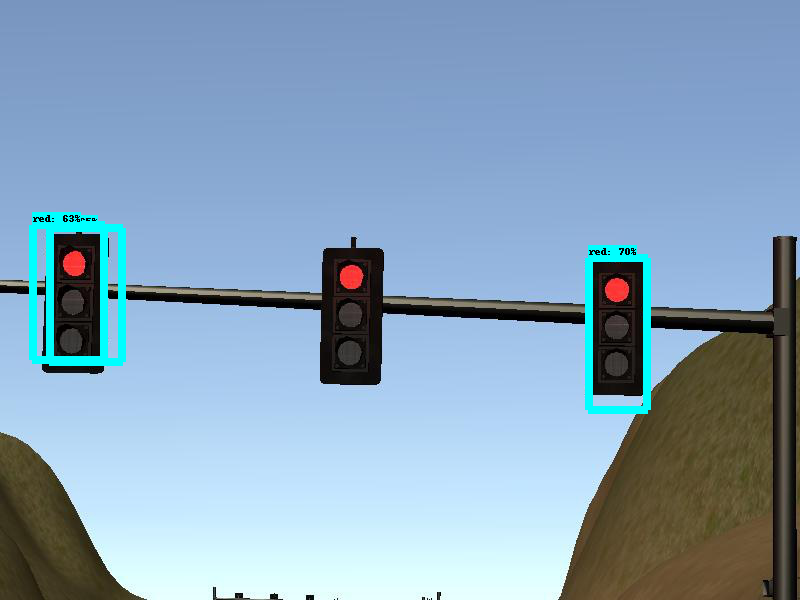

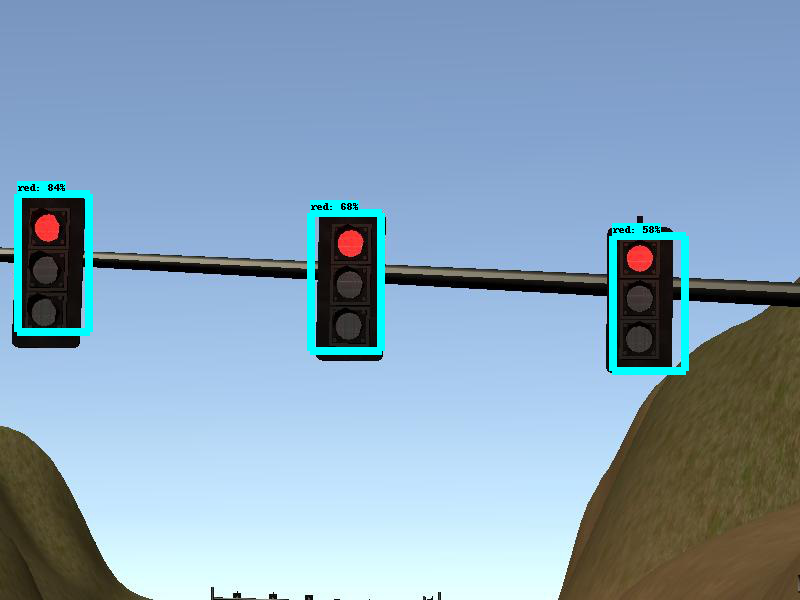

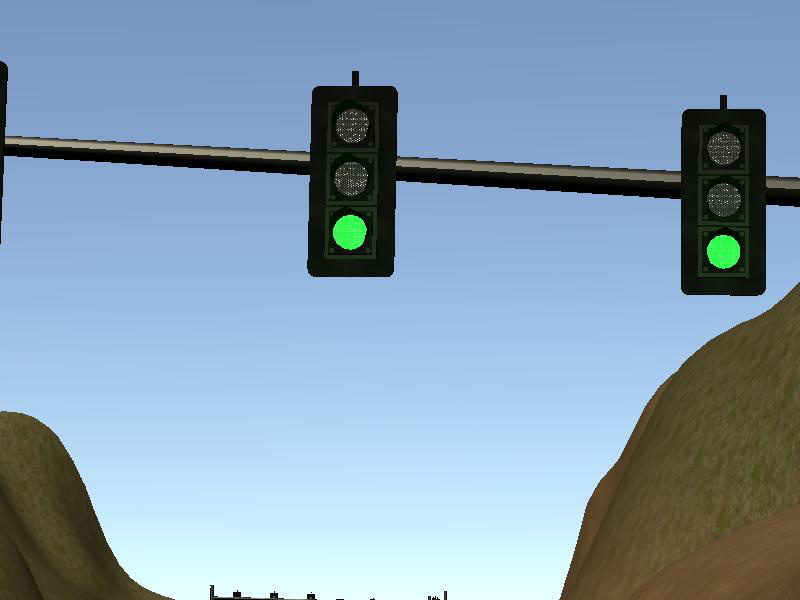

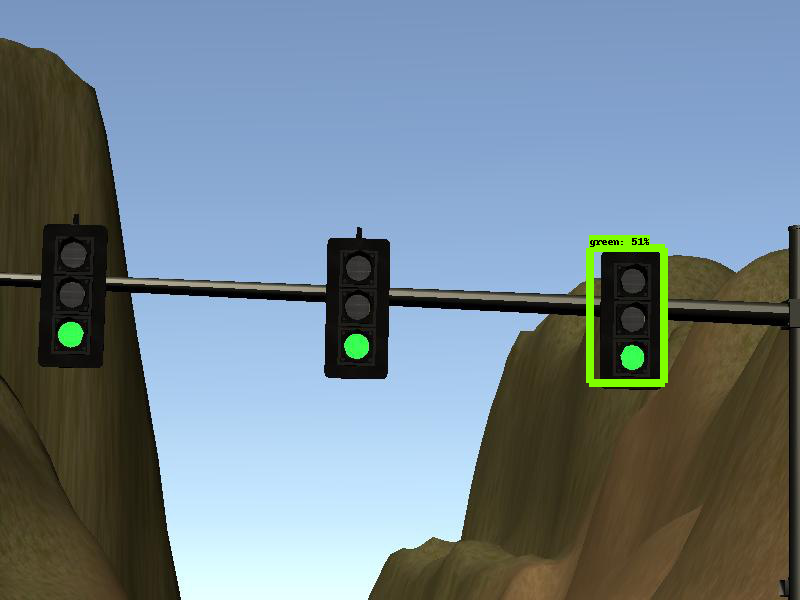

In [18]:
for image_path in TEST_IMAGE_PATHS:
    show_inference(detection_model, image_path)


### run inference on video cap

In [12]:
model_dir = './inference_graph/saved_model'
detection_model = tf.saved_model.load(str(model_dir))

PATH_TO_LABELS = 'label_map.pbtxt'
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS, use_display_name=True)


NameError: name 'tf' is not defined

In [28]:
import cv2
cap = cv2.VideoCapture(0) # or cap = cv2.VideoCapture("<video-path>")

def run_inference(model, cap):
    while cap.isOpened():
        ret, image_np = cap.read()
        # Actual detection.
        output_dict = run_inference_for_single_image(model, image_np)
        # Visualization of the results of a detection.
        vis_util.visualize_boxes_and_labels_on_image_array(
            image_np,
            output_dict['detection_boxes'],
            output_dict['detection_classes'],
            output_dict['detection_scores'],
            category_index,
            instance_masks=output_dict.get('detection_masks_reframed', None),
            use_normalized_coordinates=True,
            line_thickness=8)
        cv2.imshow('object_detection', cv2.resize(image_np, (800, 600)))
        if cv2.waitKey(25) & 0xFF == ord('q'):
            cap.release()
            cv2.destroyAllWindows()
            break

run_inference(detection_model, cap)

2021-08-26 22:19:05.464053: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)


KeyboardInterrupt: 

## Save as tflite

In [19]:
!python3 ../zombie/models/research/object_detection/export_tflite_graph_tf2.py \
    --pipeline_config_path ./inference_graph/pipeline.config \
    --trained_checkpoint_dir ./inference_graph/checkpoint \
    --output_directory ./tflite_new/

2021-08-27 16:55:28.164244: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
W0827 16:55:41.569019 4707491328 save_impl.py:71] Skipping full serialization of Keras layer <object_detection.meta_architectures.ssd_meta_arch.SSDMetaArch object at 0x7fc0ffd05760>, because it is not built.
2021-08-27 16:55:53.518791: W tensorflow/python/util/util.cc:348] Sets are not currently considered sequences, but this may change in the future, so consider avoiding using them.
W0827 16:56:15.169432 4707491328 save.py:249] Found untraced functions such as WeightSharedConvolutionalBoxPredictor_layer_call_fn, WeightSharedConvolutionalBoxPredictor_layer_call_and_return_conditional_losses, WeightSharedConvolutionalBoxHead_layer_call_fn, WeightShare

In [22]:
# Converting a SavedModel to a TensorFlow Lite model.
# No quantization
converter = tf.lite.TFLiteConverter.from_saved_model('./tflite_new/saved_model/')
tflite_model = converter.convert()


2021-08-27 16:58:02.961368: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:351] Ignored output_format.
2021-08-27 16:58:02.961394: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:354] Ignored drop_control_dependency.
2021-08-27 16:58:02.961400: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:360] Ignored change_concat_input_ranges.
2021-08-27 16:58:02.961600: I tensorflow/cc/saved_model/reader.cc:38] Reading SavedModel from: ./tflite_new/saved_model/
2021-08-27 16:58:03.069434: I tensorflow/cc/saved_model/reader.cc:90] Reading meta graph with tags { serve }
2021-08-27 16:58:03.069468: I tensorflow/cc/saved_model/reader.cc:132] Reading SavedModel debug info (if present) from: ./tflite_new/saved_model/
2021-08-27 16:58:03.759732: I tensorflow/cc/saved_model/loader.cc:211] Restoring SavedModel bundle.
2021-08-27 16:58:05.555870: I tensorflow/cc/saved_model/loader.cc:195] Running initialization op on SavedModel bundle at path: ./

In [23]:
with open('model.tflite', 'wb') as f:
    f.write(tflite_model)

### Quantization

In [46]:
import glob 
import numpy as np
from PIL import Image, ImageDraw, ImageFont
from six import BytesIO

def load_image_into_numpy_array(path):
    """Load an image from file into a numpy array.

    Puts image into numpy array to feed into tensorflow graph.
    Note that by convention we put it into a numpy array with shape
    (height, width, channels), where channels=3 for RGB.

    Args:
    path: a file path.

    Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
    """
    
    img_data = tf.io.gfile.GFile(path, 'rb').read()
    image = Image.open(BytesIO(img_data))
    (im_width, im_height) = image.size
    
    return np.array(image.getdata()).reshape(
        (im_height, im_width, 3)).astype(np.uint8)



image_dir = './train/'
image_paths = glob.glob(image_dir + 'left*.jpg')
images_np = []
for image_path in image_paths:
    images_np.append(np.expand_dims(
      load_image_into_numpy_array(image_path), axis=0))


In [25]:
# ds = tf.keras.preprocessing.image_dataset_from_directory(
#   image_dir,
#   seed=123,
#   image_size=(640, 640),
#   batch_size=4)

image = tf.keras.preprocessing.image.load_img('./train/left0011.jpg', target_size=(320, 320))
image_arr = tf.keras.preprocessing.image.img_to_array(image)
image_arr = np.array([image_arr])

In [26]:
train_images = image_arr.astype(np.float32)/255.0

In [27]:
train_images.shape

(1, 320, 320, 3)

In [29]:
def representative_data_gen():
    for input_value in tf.data.Dataset.from_tensor_slices(train_images).batch(1).take(100):
        yield [input_value]

converter = tf.lite.TFLiteConverter.from_saved_model('./tflite_new/saved_model/')
converter.optimizations = [tf.lite.Optimize.DEFAULT]
converter.representative_dataset = representative_data_gen
# Ensure that if any ops can't be quantized, the converter throws an error
converter.target_spec.supported_ops = [tf.lite.OpsSet.TFLITE_BUILTINS_INT8]
# Set the input and output tensors to uint8 (APIs added in r2.3)
converter.inference_input_type = tf.uint8
converter.inference_output_type = tf.uint8

tflite_model_quant = converter.convert()

2021-08-27 16:59:24.078282: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:351] Ignored output_format.
2021-08-27 16:59:24.078325: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:354] Ignored drop_control_dependency.
2021-08-27 16:59:24.078343: W tensorflow/compiler/mlir/lite/python/tf_tfl_flatbuffer_helpers.cc:360] Ignored change_concat_input_ranges.
2021-08-27 16:59:24.078643: I tensorflow/cc/saved_model/reader.cc:38] Reading SavedModel from: ./tflite_new/saved_model/
2021-08-27 16:59:24.220556: I tensorflow/cc/saved_model/reader.cc:90] Reading meta graph with tags { serve }
2021-08-27 16:59:24.220584: I tensorflow/cc/saved_model/reader.cc:132] Reading SavedModel debug info (if present) from: ./tflite_new/saved_model/
2021-08-27 16:59:25.007266: I tensorflow/cc/saved_model/loader.cc:211] Restoring SavedModel bundle.
2021-08-27 16:59:26.936958: I tensorflow/cc/saved_model/loader.cc:195] Running initialization op on SavedModel bundle at path: ./

In [30]:
with open('model_quantized_320.tflite', 'wb') as f:
    f.write(tflite_model_quant)